In [1]:
import igraph
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import os
os.chdir("../src")
from build_network_object import build_network_object
from draw_network_by_classification import draw_network_by_classification, compare_degrees_strength
from draw_adjacency_matrix import draw_adjacency_matrix
from draw_and_print_communities import draw_and_print_communities
from correlations import correlation_industry_pairs, correlation_network_degree,correlation_adjacency_matrix
import seaborn as sns

# "Connections" algorithm to create an adjacency matrix of industry pairs

## Data
* Join 5 years of ASHE sample, in this case 
    * from 2009 to 2013 
    * from 2014 to 2018. 
   
This can change in the future depending which matrix we want to build (2 years, 5 years, 10 years, etc).

## Selection:
* Select individuals with no missing data in age, sic07, personal id or work postcode variables. 
* Select individuals with age > 15 & age < 65.

* Loop over each unique individual in the dataset (unique "piden"):
     - Select all inputs observed for that individual into a table. e.g, for individual with "piden"==1 :
        
| piden | year | sic07 |work postcode |
|-------|------|-------|--------------|
| 1     | 2009 | A     | A1           |
| 1     | 2010 | A     | A1           |
| 1     | 2010 | B     | B1           |
| 1     | 2011 | C     | C1           |
| 1     | 2013 | D     | D1           |
| 1     | 2013 | D     | D2           |


## Algorithm:


   * **Build "connections"**: Define a connection as all possible combinations found for that individual. Create a connection table as the following:

| piden | flow | years    |postcodes|
|-------|------|----------|---------|
| 1     | A-A  |2009-2010 | A1-A1   | 
| 1     | A-B  |2009-2010 | A1-B1   | 
| 1     | A-C  |2009-2011 | A1-C1   | 
| 1     | A-D  |2009-2013 | A1-D1   |
| 1     | A-D  |2009-2013 | A1-D2   | 
| 1     | A-B  |2010-2010 | A1-B1   | 
| 1     | A-C  |2010-2011 | A1-C1   | 
| 1     | A-D  |2010-2013 | A1-D1   | 
| 1     | A-D  |2010-2013 | A1-D2   | 
| 1     | B-C  |2010-2011 | B1-C1   | 
| 1     | B-D  |2010-2013 | B1-D1   | 
| 1     | B-D  |2010-2013 | B1-D2   | 
| 1     | C-D  |2011-2013 | C1-D1   | 
| 1     | C-D  |2011-2013 | C1-D2   | 
| 1     | D-D  |2013-2013 | D1-D2   | 


## Select valid flows/connections:

The flow/connection selection is agnostic to the approach used before.

   * Define a time threshold, valid flows/connections can not be separated by more than X years (eg. in this case 2 years).
   * A flow/connection can not happen within the same job in 2 different years (if the flow/connection industry code and the work postcode are the same is not considered).
   * Only consider unique flows/connection (especially for the connection table).
  
  eg. resulting connection table:

   
| piden | flow | years    |postcodes|
|-------|------|----------|---------|
| 1     | A-B  |2009-2010 | A1-B1   | 
| 1     | A-C  |2009-2011 | A1-C1   | 
| 1     | B-C  |2010-2011 | B1-C1   | 
| 1     | C-D  |2011-2013 | C1-D1   | 
| 1     | C-D  |2011-2013 | C1-D2   | 
| 1     | D-D  |2013-2013 | D1-D2   | 
   

## Adjacency matrix

Project the flows/connection pairs to an adjacency matrix. Each pair is 1 count.

* Connections are considered un-directed, matrix is symmetrical: 

| - | A    | B  | C  | D  |
|---|------|----|----|----|
| A |  0   | 1  | 1  | 0  |
| B |  1   | 0  | 1  | 0  |
| C |  1   | 1  | 0  | 1  |
| D |  0   | 0  | 1  | 1  |
    

## Normalisation process:


* The adjacency matrix is normalised following the procedure described by [Neffke](http://doku.iab.de/fdz/reporte/2017/MR_04-17_EN.pdf)


# Comparison between 2009-2013 and 2014-2018 matrices 
## 2009 - 2013:

In [2]:
label1 = "Table2_Reduced_matrix_2009_2013_connections"

reduced_matrix_2009_2013 = pd.read_csv("../data/"+label1+".csv", index_col=0)
reduced_matrix_2009_2013 = reduced_matrix_2009_2013[reduced_matrix_2009_2013['StartIndst']!=0]


sub_matrix_2009_2013_less1 = reduced_matrix_2009_2013[reduced_matrix_2009_2013['weight']<1].sort_values(by=['weight'], ascending=False)
sub_matrix_2009_2013 = sub_matrix_2009_2013_less1[sub_matrix_2009_2013_less1['weight']>0].sort_values(by=['weight'], ascending=False)

print ("Number of links:", sub_matrix_2009_2013.shape[0]/2)

print ("Number of 4-digit industries observed:")
print (len(np.unique([sub_matrix_2009_2013['StartIndst'].values,sub_matrix_2009_2013['FinalIndst'].values])))

sub_matrix_2009_2013[1:15]

Number of links: 754.0
Number of 4-digit industries observed:
300


,StartIndst,FinalIndst,weight,SubActivity_StartIndst,SubActivity_FinalIndst,MainActivity_StartIndst,MainActivity_FinalIndst,MainIndustry_StartIndst,MainIndustry_FinalIndst,Counts
2394,2731,2732,0.999793,Fibre optic cables,"Other electronic, electric wires",Electrical equipment,Electrical equipment,"Manufacture computer, electronic, light electr...","Manufacture computer, electronic, light electr...",12.0
2387,1712,1813,0.999737,"Paper, paperboard","Pre-press, pre-media services",Paper and paper products,Printing,All other Manufacturing,All other Manufacturing,18.0
2266,1813,1712,0.999737,"Pre-press, pre-media services","Paper, paperboard",Printing,Paper and paper products,All other Manufacturing,All other Manufacturing,10.0
2373,2814,2812,0.999531,"Other taps, valves",Fluid power equipment,General machinery,General machinery,"Manufacture machinery, vehicle, transport","Manufacture machinery, vehicle, transport",16.0
2285,2812,2814,0.999531,Fluid power equipment,"Other taps, valves",General machinery,General machinery,"Manufacture machinery, vehicle, transport","Manufacture machinery, vehicle, transport",10.0
2307,812,2362,0.999501,"Gravel, sand pits; clays, kaolin",Plaster products for construction,"Mining, Quarrying and other","Concrete, cement and plaster","Mining, Quarrying (inc extraction of petroleum...",All other Manufacturing,20.0
2244,2362,812,0.999501,Plaster products for construction,"Gravel, sand pits; clays, kaolin","Concrete, cement and plaster","Mining, Quarrying and other",All other Manufacturing,"Mining, Quarrying (inc extraction of petroleum...",15.0
2375,1722,1729,0.999483,"Household, sanitary, toilet goods",Other,Paper and paper products,Paper and paper products,All other Manufacturing,All other Manufacturing,10.0
2366,1729,1722,0.999483,Other,"Household, sanitary, toilet goods",Paper and paper products,Paper and paper products,All other Manufacturing,All other Manufacturing,10.0
2192,2751,4643,0.999473,Electric domestic appliances,Electrical appliances,Electrical equipment,Household goods wholesale,"Manufacture computer, electronic, light electr...","Wholesale and retail,motor vehicle repair,sale...",23.0


## 2014 - 2018:


In [3]:
label2 = "Table4_Reduced_matrix_2014_2018_connections"
reduced_matrix_2014_2018 = pd.read_csv("../data/"+label2+".csv", index_col=0)
reduced_matrix_2014_2018 = reduced_matrix_2014_2018[reduced_matrix_2014_2018['StartIndst']!=0]


sub_matrix_2014_2018_less1 = reduced_matrix_2014_2018[reduced_matrix_2014_2018['weight']<1].sort_values(by=['weight'], ascending=False)
sub_matrix_2014_2018 = sub_matrix_2014_2018_less1[sub_matrix_2014_2018_less1['weight']>0].sort_values(by=['weight'], ascending=False)

print ("Number of links:", sub_matrix_2014_2018.shape[0]/2)
sub_matrix_2014_2018[1:15]
print ("Number of 4-digit industries observed:")
print (len(np.unique([sub_matrix_2014_2018['StartIndst'].values,sub_matrix_2014_2018['FinalIndst'].values])))
sub_matrix_2014_2018[1:15]

Number of links: 702.0
Number of 4-digit industries observed:
230


,StartIndst,FinalIndst,weight,SubActivity_StartIndst,SubActivity_FinalIndst,MainActivity_StartIndst,MainActivity_FinalIndst,MainIndustry_StartIndst,MainIndustry_FinalIndst,Counts
2458,147,1091,0.999598,Raising of poultry,Prepared farm animals feeds,"Animal production, hunting",Food products - other,"Agriculture, Forestry, Fishing, Veterinary","Manufacture food, drink, tobacco",10.0
2350,4636,1082,0.999488,"Sugar, chocolate","Cocoa, choc, sugar confectionery","Food, beverages, tobacco wholesale",Food products - other,"Wholesale and retail,motor vehicle repair,sale...","Manufacture food, drink, tobacco",10.0
2474,1082,4636,0.999488,"Cocoa, choc, sugar confectionery","Sugar, chocolate",Food products - other,"Food, beverages, tobacco wholesale","Manufacture food, drink, tobacco","Wholesale and retail,motor vehicle repair,sale...",25.0
2269,2399,2363,0.999398,Non-metallic mineral nec,Ready-mixed concrete,Other non-metallic mineral products,"Concrete, cement and plaster",All other Manufacturing,All other Manufacturing,10.0
2473,2363,2399,0.999398,Ready-mixed concrete,Non-metallic mineral nec,"Concrete, cement and plaster",Other non-metallic mineral products,All other Manufacturing,All other Manufacturing,35.0
2454,1084,1089,0.999357,Condiments and seasonings,Other food products nec,Food products - other,Food products - other,"Manufacture food, drink, tobacco","Manufacture food, drink, tobacco",10.0
2479,1089,1084,0.999357,Other food products nec,Condiments and seasonings,Food products - other,Food products - other,"Manufacture food, drink, tobacco","Manufacture food, drink, tobacco",11.0
2481,3109,3103,0.999277,Other,Mattresses,Furniture,Furniture,All other Manufacturing,All other Manufacturing,10.0
2304,3103,3109,0.999277,Mattresses,Other,Furniture,Furniture,All other Manufacturing,All other Manufacturing,10.0
2243,2351,811,0.999267,Cement,"Ornamental, building stone etc",Other non-metallic mineral products,"Mining, Quarrying and other",All other Manufacturing,"Mining, Quarrying (inc extraction of petroleum...",25.0


/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


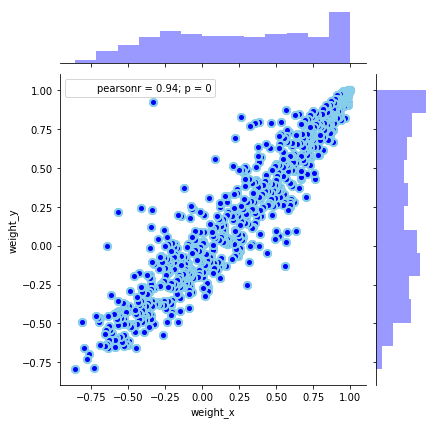

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


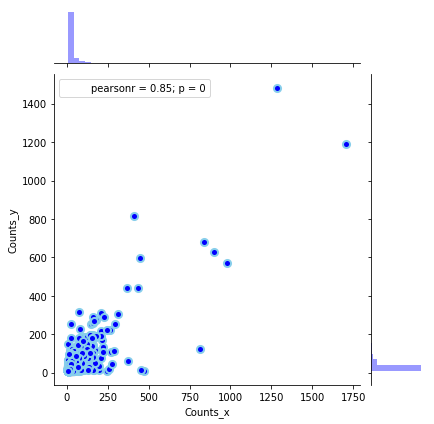

In [4]:
correlation_industry_pairs(sub_matrix_2009_2013_less1,sub_matrix_2014_2018_less1)


correlation_industry_pairs(sub_matrix_2009_2013_less1,sub_matrix_2014_2018_less1,'counts')


/Users/crangelsmith/PycharmProjects/KnowledgeFlows/python/labour_flows_matrix/src/correlations.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  df_industry1['id'] = df_industry1.groupby(['StartIndst', 'FinalIndst']).ngroup()
/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


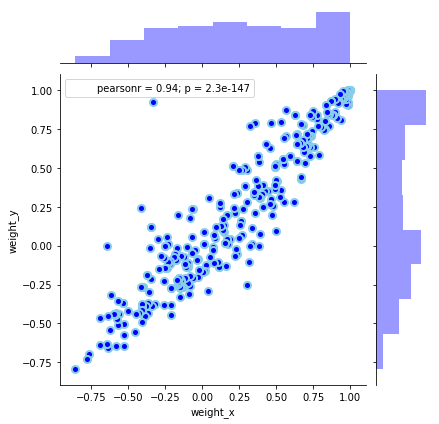

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


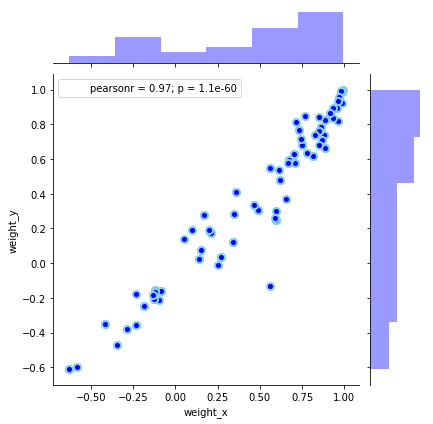

In [5]:
correlation_industry_pairs(sub_matrix_2009_2013_less1[sub_matrix_2009_2013_less1['Counts']<11],sub_matrix_2014_2018_less1,'weight')


correlation_industry_pairs(sub_matrix_2009_2013_less1[sub_matrix_2009_2013_less1['Counts']>100],sub_matrix_2014_2018_less1,'weight')


In [6]:
Gm_simple_2009_2013 = build_network_object(reduced_matrix_2009_2013,'weight')
Gm_simple_2014_2018 = build_network_object(reduced_matrix_2014_2018,'weight')

## Degree comparison:

NETWORK OF 2009-2013


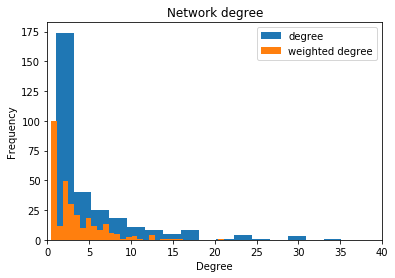

mean degree 5.026666666666666
mean strenght 3.325701689545516


NETWORK OF 2014-2018


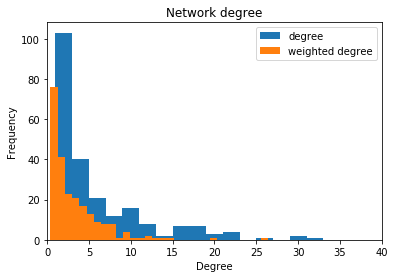

mean degree 6.104347826086957
mean strenght 3.3250012990964497


In [7]:
print ('NETWORK OF 2009-2013')
compare_degrees_strength(Gm_simple_2009_2013)
print()
print()
print ('NETWORK OF 2014-2018')
compare_degrees_strength(Gm_simple_2014_2018)

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


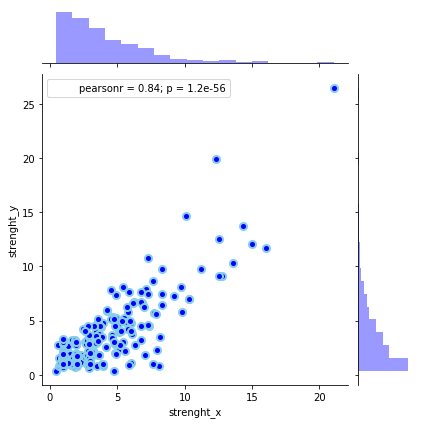

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


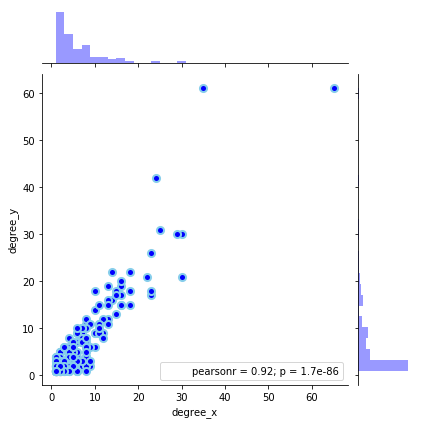

In [8]:
correlation_network_degree(Gm_simple_2009_2013,Gm_simple_2014_2018,'strength')
correlation_network_degree(Gm_simple_2009_2013,Gm_simple_2014_2018,'degree')


## Adjacency matrix:
### 2009-2013:

In [9]:
draw_adjacency_matrix(reduced_matrix_2009_2013,['StartIndst','FinalIndst'],'weight')

### 2014-2018:

In [10]:
draw_adjacency_matrix(reduced_matrix_2014_2018,['StartIndst','FinalIndst'],'weight')

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


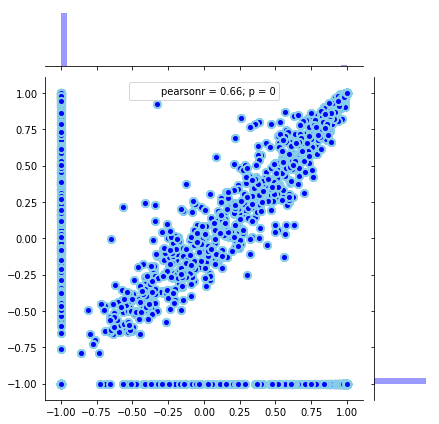

adjacency matrix correlation
(0.6617369929177555, 0.0)
percentage of the entries with non-symetrical missigness
1.0542806019793747


In [11]:
correlation_adjacency_matrix(reduced_matrix_2009_2013,reduced_matrix_2014_2018,'weight')

# Network visualisation: by main industry

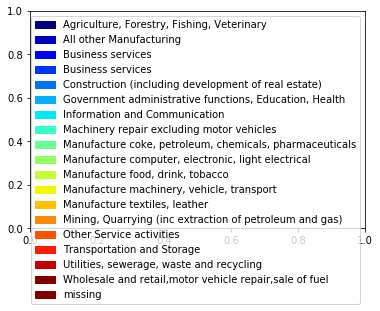

0

In [12]:
draw_network_by_classification(Gm_simple_2009_2013,'mainindustry','../img/'+label1+'/network_industry.png')

![title](../img/Table1_Reduced_matrix_2009_2013_flows/network_industry.png)


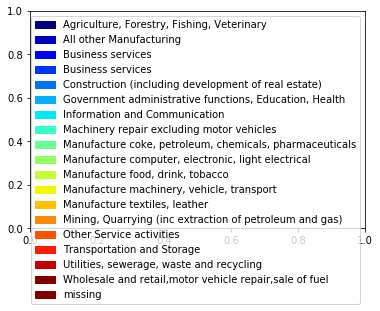

0

In [13]:
draw_network_by_classification(Gm_simple_2014_2018,'mainindustry','../img/'+label2+'/network_industry.png')

![title](../img/Table3_Reduced_matrix_2014_2018_flows/network_industry.png)


## Network visualisation: by community
## 2009 -2013:

In [14]:
network_components_2009_2013 = Gm_simple_2009_2013.components()
network_largest_2009_2013 = network_components_2009_2013.subgraphs()[0]


In [15]:
net_community_2009_2013 = network_largest_2009_2013.community_multilevel(weights=network_largest_2009_2013.es['weight'])
print ('Modularity',net_community_2009_2013.modularity)

Modularity 0.6324268271415231


In [16]:
draw_and_print_communities(network_largest_2009_2013,net_community_2009_2013,'../img/'+label1+'/network_community.png')

Community : 1
['Agriculture, Forestry, Fishing, Veterinary' 'Business services'
 'Government administrative functions, Education, Health'
 'Other Service activities' 'Transportation and Storage']

Community : 2
['Business services '
 'Government administrative functions, Education, Health'
 'Other Service activities']

Community : 3
['Information and Communication' 'Manufacture food, drink, tobacco'
 'Manufacture textiles, leather' 'Other Service activities'
 'Wholesale and retail,motor vehicle repair,sale of fuel']

Community : 4
['All other Manufacturing' 'Business services' 'Business services '
 'Government administrative functions, Education, Health'
 'Information and Communication'
 'Manufacture computer, electronic, light electrical'
 'Other Service activities'
 'Wholesale and retail,motor vehicle repair,sale of fuel']

Community : 5
['Agriculture, Forestry, Fishing, Veterinary' 'All other Manufacturing'
 'Business services' 'Manufacture food, drink, tobacco'
 'Manufacture machin

## 2014 - 2018:



In [17]:
network_components_2014_2018 = Gm_simple_2014_2018.components()
network_largest_2014_2018 = network_components_2014_2018.subgraphs()[0]
net_community_2014_2018 = network_largest_2014_2018.community_multilevel(weights=network_largest_2014_2018.es['weight'])

print ('Modularity',net_community_2014_2018.modularity)


Modularity 0.6093126267719118


In [18]:
draw_and_print_communities(network_largest_2014_2018,net_community_2014_2018,'../img/'+label2+'/network_community.png')

Community : 1
['Business services'
 'Government administrative functions, Education, Health'
 'Manufacture coke, petroleum, chemicals, pharmaceuticals'
 'Other Service activities'
 'Wholesale and retail,motor vehicle repair,sale of fuel' 'missing']

Community : 2
['All other Manufacturing' 'Business services'
 'Government administrative functions, Education, Health'
 'Information and Communication'
 'Manufacture coke, petroleum, chemicals, pharmaceuticals'
 'Manufacture textiles, leather' 'Other Service activities'
 'Transportation and Storage' 'Utilities, sewerage, waste and recycling'
 'Wholesale and retail,motor vehicle repair,sale of fuel']

Community : 3
['Business services' 'Transportation and Storage']

Community : 4
['Business services' 'Business services '
 'Manufacture machinery, vehicle, transport']

Community : 5
['All other Manufacturing' 'Business services'
 'Manufacture computer, electronic, light electrical'
 'Manufacture food, drink, tobacco'
 'Manufacture machinery, v

### 2009 - 2013:

!['something here'](../img/Table1_Reduced_matrix_2009_2013_flows/network_community.png)


### 2014 - 2018:


![title](../img/Table3_Reduced_matrix_2014_2018_flows/network_community.png)
